## Quiz 1：彩色影像轉灰階影像

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import importlib
import cv2
import time

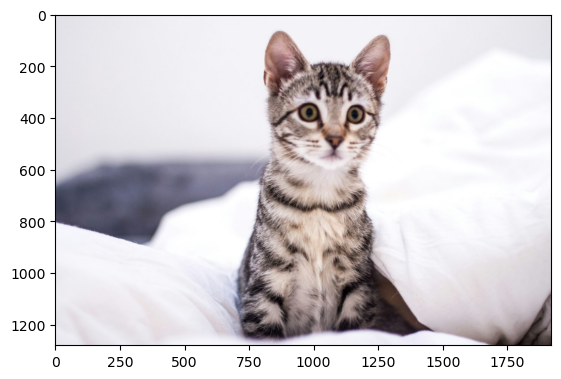

In [114]:
image_path = "Data/cat.jpg"
img = cv2.imread(image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.show()

### 使用CV2轉換

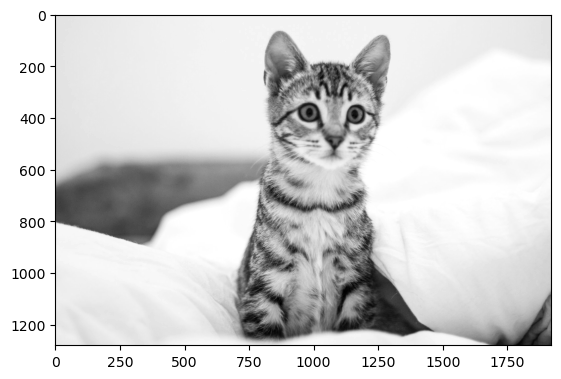

In [115]:
gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
plt.imshow(gray_img, cmap='gray')

In [116]:
run_time = 100
total_time = 0
for i in range(run_time):
    start_time = time.time()
    _ = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    end_time = time.time()
    total_time += end_time - start_time
print("平均花費時間:",total_time/run_time)

平均花費時間: 0.0006228375434875488


### 使用numpy轉換

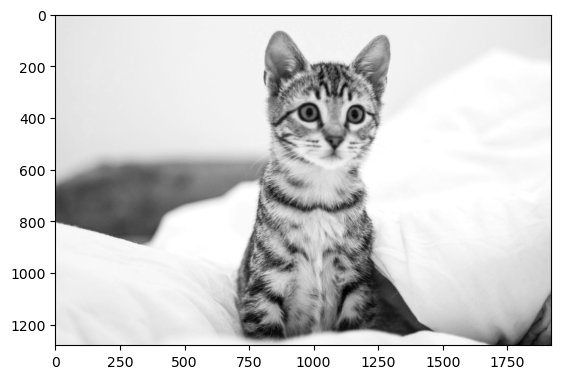

In [117]:
color_weight = np.array([0.2989, 0.5870, 0.1140])
gray_img_np = np.dot(img, color_weight).astype(int)
plt.imshow(gray_img_np, cmap='gray')

In [119]:
run_time = 100
total_time = 0
for i in range(run_time):
    start_time = time.time()
    _ = np.dot(img, color_weight).astype(int)
    end_time = time.time()
    total_time += end_time - start_time
print("平均花費時間:",total_time/run_time)

平均花費時間: 0.039475293159484864


In [120]:
print("兩圖平均誤差:",np.mean(np.abs(gray_img_np - gray_img)))

兩圖平均誤差: 0.6806685384114584


## Quiz 2：Histogram Equalization

### 使用CV2轉換

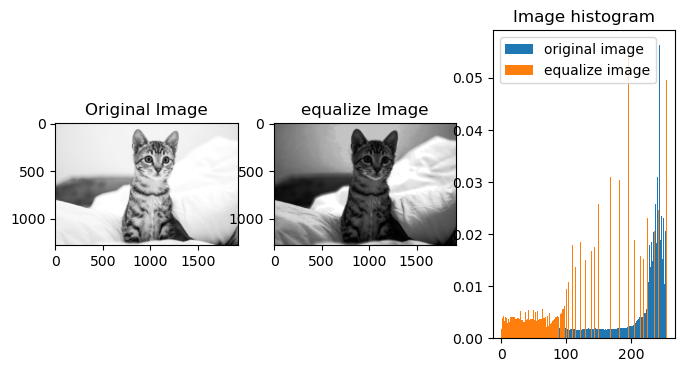

In [134]:
plt.figure(figsize=(8, 4))
plt.subplot(1, 3, 1).set_title("Original Image")
plt.imshow(gray_img,cmap='gray')
plt.subplot(1, 3, 2).set_title("equalize Image")
equalize_img = cv2.equalizeHist(gray_img)
plt.imshow(equalize_img,cmap='gray')
plt.subplot(1, 3, 3).set_title("Image histogram")
plt.hist(gray_img.ravel(), 256, [0, 255],label= 'original image' ,density=True)
plt.hist(equalize_img.ravel(), 256, [0, 255],label= 'equalize image' ,density=True)
plt.legend()
plt.show()

In [82]:
run_time = 100
total_time = 0
for i in range(run_time):
    start_time = time.time()
    _ =  cv2.equalizeHist(gray_img)
    end_time = time.time()
    total_time += end_time - start_time
print("平均花費時間:",total_time/run_time)

平均花費時間: 0.0011251020431518556


### 使用numpy轉換

In [155]:
def np_histogram_equalization(image):
    hist = np.bincount(image.ravel(), minlength=256)
    cdf = hist.cumsum()
    cdf_min = cdf[cdf > 0][0]
    if cdf[-1] == cdf_min:
        return image.copy()
    lut = (cdf - cdf_min) * 255.0 / (cdf[-1] - cdf_min)
    lut = np.clip(np.rint(lut), 0, 255).astype(np.uint8)
    return lut[image]

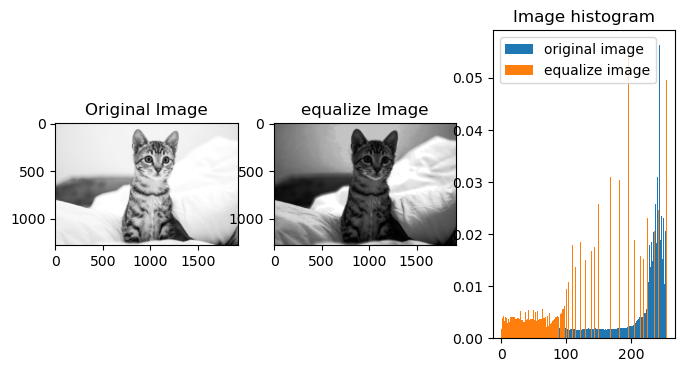

In [156]:
plt.figure(figsize=(8, 4))
plt.subplot(1, 3, 1).set_title("Original Image")
plt.imshow(gray_img,cmap='gray')
plt.subplot(1, 3, 2).set_title("equalize Image")
equalize_img_np = np_histogram_equalization(gray_img)
plt.imshow(equalize_img_np,cmap='gray')
plt.subplot(1, 3, 3).set_title("Image histogram")
plt.hist(gray_img.ravel(), 256, [0, 255],label= 'original image' ,density=True)
plt.hist(equalize_img_np.ravel(), 256, [0, 255],label= 'equalize image' ,density=True)
plt.legend()
plt.show()

In [157]:
run_time = 100
total_time = 0
for i in range(run_time):
    start_time = time.time()
    _ =  np_histogram_equalization(gray_img)
    end_time = time.time()
    total_time += end_time - start_time
print("平均花費時間:",total_time/run_time)

平均花費時間: 0.01260169267654419


兩圖平均誤差: 0.0


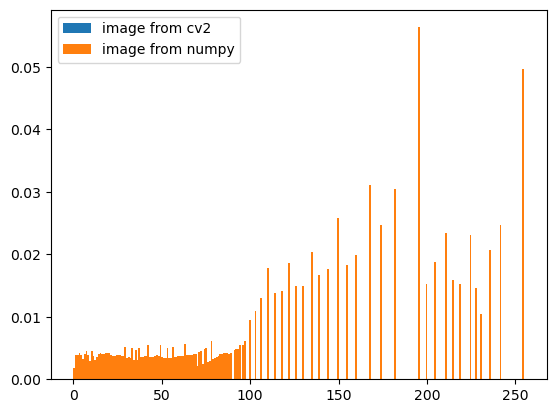

In [158]:
print("兩圖平均誤差:",np.mean(np.abs(equalize_img_np - equalize_img)))
plt.hist(equalize_img.ravel(), 256, [0, 255],label= 'image from cv2' ,density=True)
plt.hist(equalize_img_np.ravel(), 256, [0, 255],label= 'image from numpy' ,density=True)
plt.legend()
plt.show()

## Quiz 3：梯形校正與透視轉換

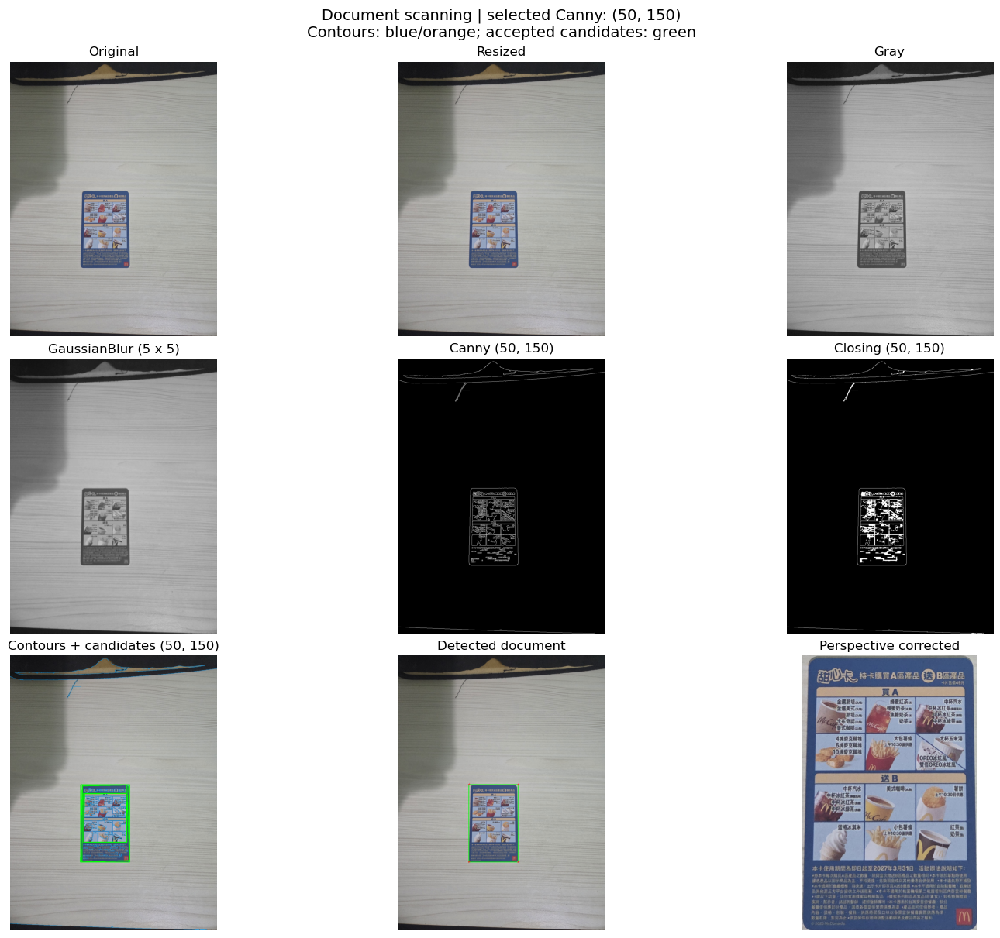

In [21]:
import Code.document_scanner as scanner

importlib.reload(scanner)

image = cv2.imread("Data/20260922_232301.jpg")
scanned = scanner.scan_document(image, show_steps=True)

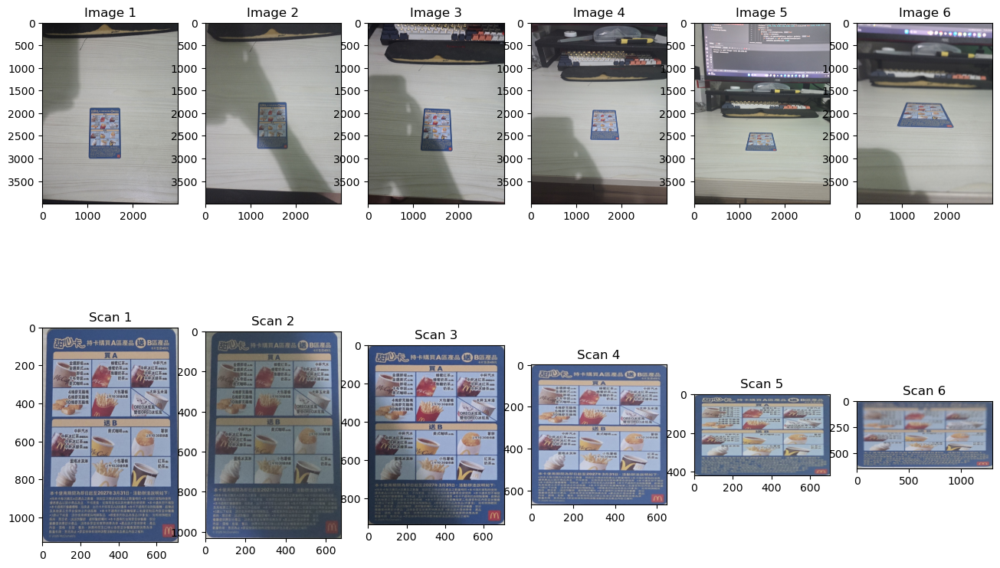

In [28]:
plt.figure(figsize=(16, 10))
image_list = ["Data/20260922_232301.jpg", "Data/20260922_232258.jpg", "Data/20260922_232256.jpg", "Data/20260922_232254.jpg", "Data/20260922_232249.jpg", "Data/20260922_232107.jpg"]
for n,image_path in enumerate(image_list):
    plt.subplot(2,len(image_list), n+1).set_title("Image {}".format(n+1))
    image = cv2.cvtColor(cv2.imread(image_path),cv2.COLOR_BGR2RGB)
    scanned = scanner.scan_document(image)
    plt.imshow(image)
    plt.subplot(2,len(image_list), len(image_list)+n+1).set_title("Scan {}".format(n+1))
    if scanned is not None:
        plt.imshow(scanned)

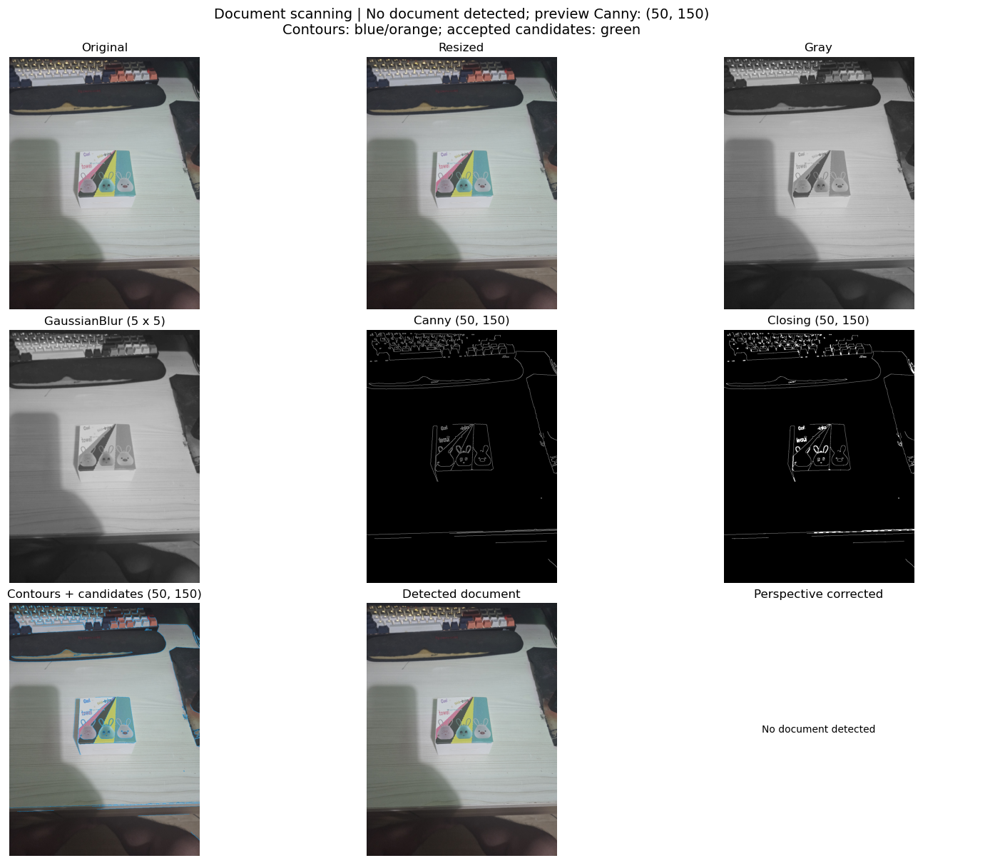

No document detected.


In [23]:
importlib.reload(scanner)

image = cv2.imread("Data/20260922_232347.jpg")
scanned = scanner.scan_document(image, show_steps=True)

## Quiz 4：梯形校正與透視轉換

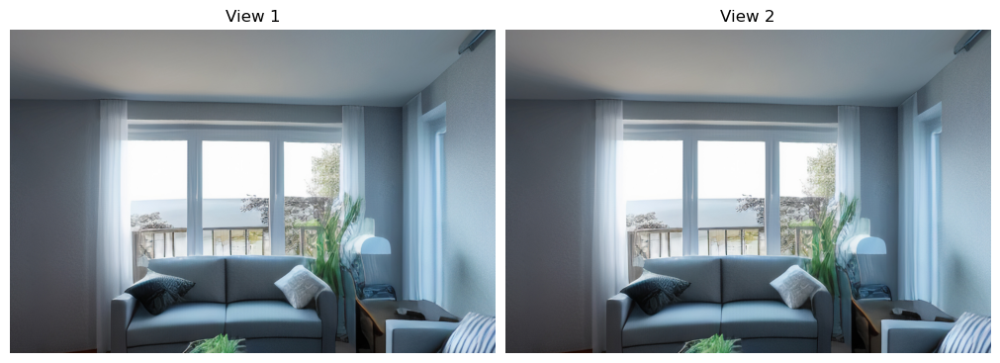

In [41]:
import Code.panorama_views as pano

panorama = pano.read_panorama("Data/shot-panoramic-composition-living-room.jpg")

images = pano.extract_views(
    panorama,
    yaws=[10, 10],
    roll=[0, 0],
    pitch=0,
    hfov=80,
    size=(960, 640),
)

image_left, image_right = images
pano.show_views(images)

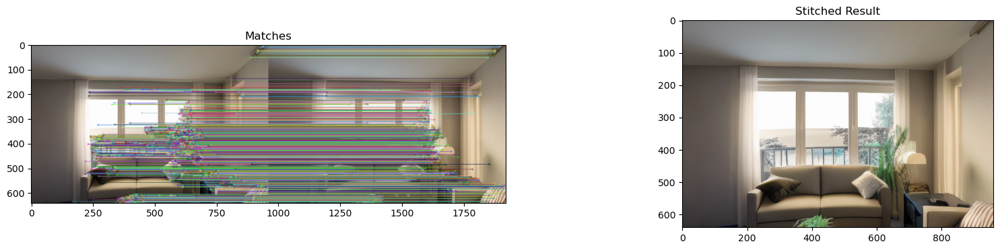

In [39]:
def stitch_images(img1, img2, ratio_thresh=0.5, min_matches=10):
    result = None
    match_img = None

    gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
    sift = cv2.SIFT_create()
    keypoints1, descriptors1 = sift.detectAndCompute(gray1, None)
    keypoints2, descriptors2 = sift.detectAndCompute(gray2, None)
    
    if descriptors1 is None or descriptors2 is None:
        print("無法在圖片中偵測到足夠的特徵點")
        return match_img, result
    
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
    search_params = dict(checks=50)
    flann = cv2.FlannBasedMatcher(index_params, search_params)

    matches = flann.knnMatch(descriptors1, descriptors2, k=2)
    good_matches = []
    for m, n in matches:
        if m.distance < ratio_thresh * n.distance:
            good_matches.append(m)
    
    if len(good_matches) < min_matches:
        print("匹配點數量不足（目前只有 {} 個".format(len(good_matches)))
        return match_img, result
    
    match_img = cv2.drawMatches(
        img1, keypoints1,
        img2, keypoints2,
        good_matches, None,
        flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
    )
    
    src_pts = np.float32([keypoints1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([keypoints2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    
    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    
    if H is None:
        print("無法計算 Homography 矩陣")
        return match_img, result

    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    
    corners1 = np.float32([[0, 0], [0, h1], [w1, h1], [w1, 0]]).reshape(-1, 1, 2)
    corners1_transformed = cv2.perspectiveTransform(corners1, H)
    
    corners2 = np.float32([[0, 0], [0, h2], [w2, h2], [w2, 0]]).reshape(-1, 1, 2)
    
    all_corners = np.concatenate((corners1_transformed, corners2), axis=0)
    
    [x_min, y_min] = np.int32(all_corners.min(axis=0).ravel() - 0.5)
    [x_max, y_max] = np.int32(all_corners.max(axis=0).ravel() + 0.5)
    
    translation = np.array([
        [1, 0, -x_min],
        [0, 1, -y_min],
        [0, 0, 1]
    ], dtype=np.float64)
    
    result_width = x_max - x_min
    result_height = y_max - y_min
    
    result = cv2.warpPerspective(img1, translation @ H, (result_width, result_height))
    result[-y_min:h2 - y_min, -x_min:w2 - x_min] = img2
    
    return match_img, result
match_img, stitched = stitch_images(image_left, image_right)
plt.figure(figsize=(20, 4))
plt.subplot(1,2,1).set_title("Matches")
plt.imshow(match_img)
plt.subplot(1,2,2).set_title("Stitched Result")
plt.imshow(stitched)

### 測試不同水平角度之拼接效果

匹配點數量不足（目前只有 2 個
於角度70時失敗


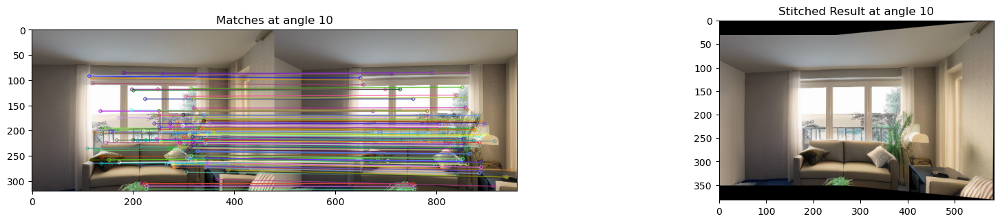

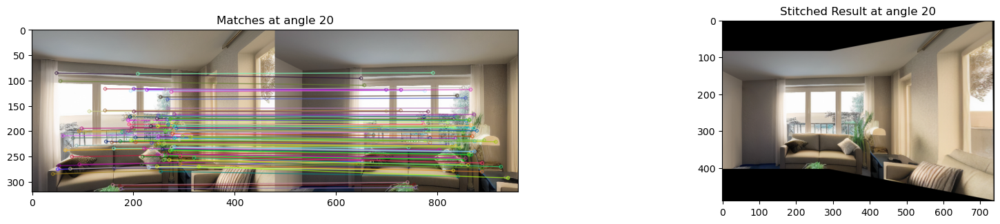

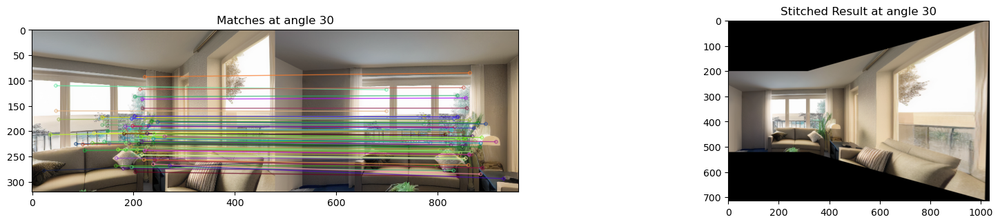

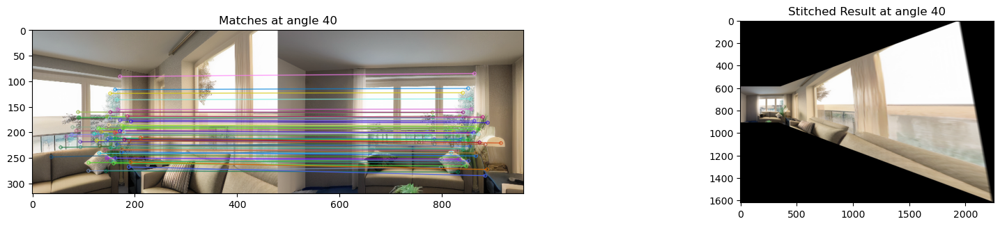

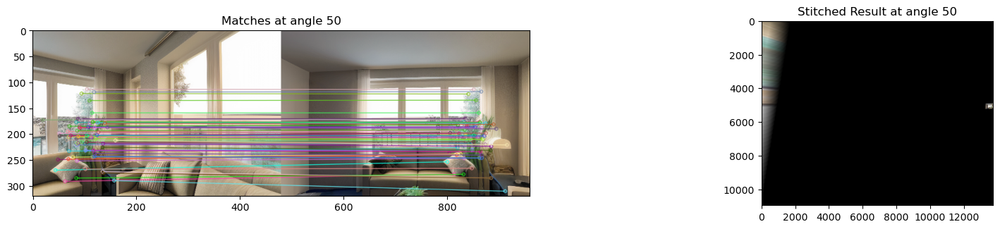

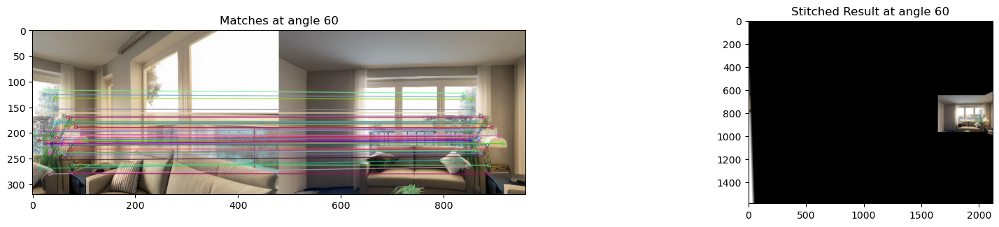

In [40]:
angels = [10, 20, 30, 40, 50, 60, 70, 80, 90]
for n,angle in enumerate(angels):
    images = pano.extract_views(
        panorama,
        yaws=[angle, 0],
        pitch=0,
        hfov=80,
        size=(480, 320),
    )
    image_left, image_right = images
    match_img, stitched = stitch_images(image_left, image_right)
    if match_img is None:
        print("於角度{}時失敗".format(angle))
        break
    plt.figure(figsize=(20, 4*len(angels)))
    plt.subplot(len(angels),2,2*(n+1)-1).set_title("Matches at angle {}".format(angle))
    plt.imshow(match_img)
    plt.subplot(len(angels),2,2*(n+1)).set_title("Stitched Result at angle {}".format(angle))
    plt.imshow(stitched)


### 固定水平角度為30，旋轉相機拍攝角度

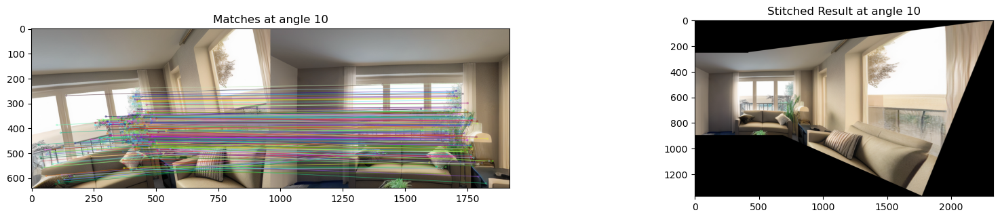

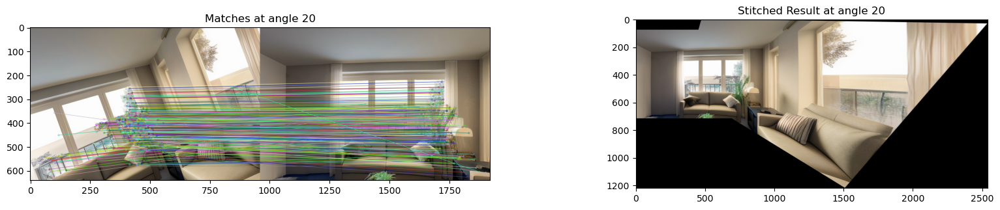

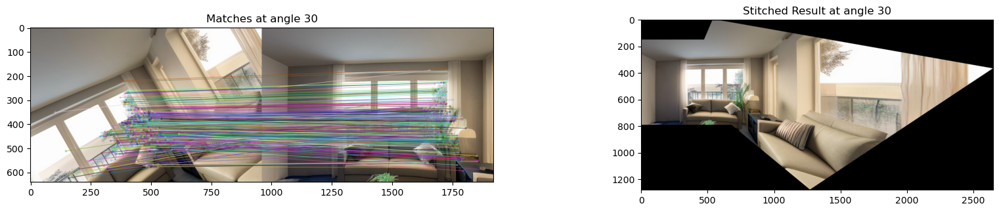

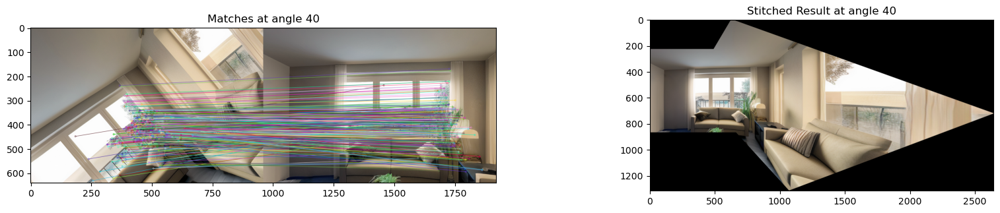

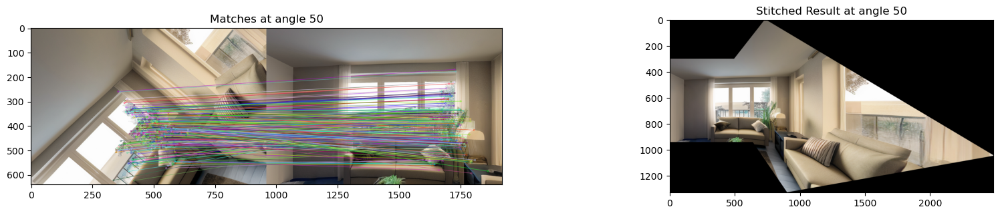

...

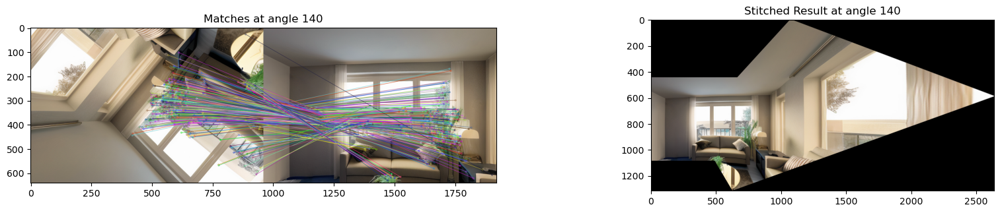

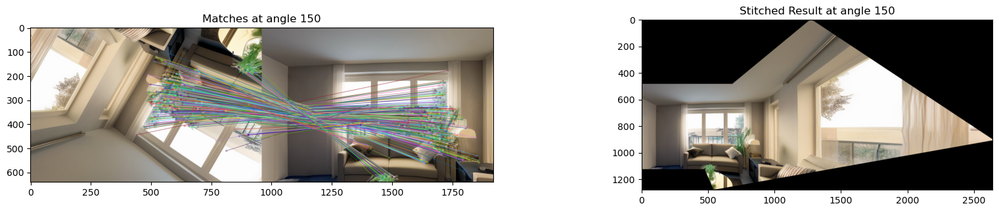

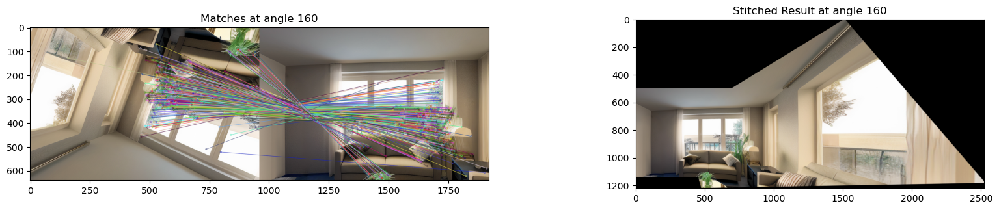

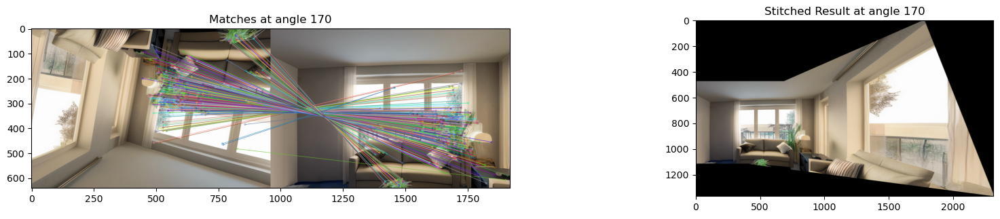

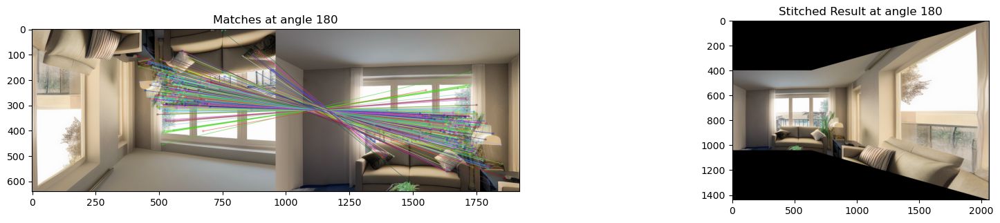

In [44]:
angels = [10, 20, 30, 40, 50, 60, 70, 80, 90 ,100 ,110 ,120 ,130 ,140,150 ,160 ,170,180]
for n,angle in enumerate(angels):
    images = pano.extract_views(
        panorama,
        yaws=[30, 0],
        pitch=0,
        roll=[angle, 0],
        hfov=80,
        size=(960, 640),
    )
    image_left, image_right = images
    match_img, stitched = stitch_images(image_left, image_right)
    if match_img is None:
        print("於角度{}時失敗".format(angle))
        break
    plt.figure(figsize=(20, 4*len(angels)))
    plt.subplot(len(angels),2,2*(n+1)-1).set_title("Matches at angle {}".format(angle))
    plt.imshow(match_img)
    plt.subplot(len(angels),2,2*(n+1)).set_title("Stitched Result at angle {}".format(angle))
    plt.imshow(stitched)
